<center><img src="aux_images/banner_switso.png"></center>

<p style="font-family: Verdana; font-size: 18px; text-align: justify; line-height: 1.8;"><b>Have you ever seen this very relatable meme before?</b></p>

<center><img src="aux_images/switso_meme.jpeg"></center>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;"><b>Woof woof!</b></p>
    
<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">If you are like me and absolutely cannot distinguish all these Filipino favorites, you have come to the right place!</p>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">To the average Filipino out there, these are all switsos. But with the help of AI, we can <i>finally</i> distinguish these little doggos from each other. Through the magical realm of computer vision, powered by the renowned VGG-19 architecture, join me as we embark on a quest to unravel the confusion surrounding these cute, friendly switsos!</p>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">For the sake of simplicity, we will only focus on the lower four doggos from this meme: the <b>Lhasa Apso, Maltese, Pekingese, and Shih Tzu</b>.</p>

<h1 style="font-family:Verdana; color:#0D52BD; font-size:26px">Building the Model</h1>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">But first, let's run the following imports so we can start identifying our switsos!</p>

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import joblib
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from sklearn.metrics import confusion_matrix
from torchvision import models, transforms, datasets
from torchsummary import summary
from PIL import Image, ImageDraw, ImageFont
from tqdm.notebook import tqdm, trange
from pathlib import Path
from torch.utils.data import DataLoader
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">We need to establish the path to our switso photos, which our model will train on.</p>

In [2]:
data_dir = Path('cropped_doggos')

train_dir = data_dir / "train"
val_dir = data_dir / "validation"
test_dir = data_dir / "test"

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">This code will just transform the doggo images in our train, validation, and test folders into tensors that the computer can understand and work on.</p>

In [3]:
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=transforms.Compose(
                                      [transforms.Resize((224, 224)),
                                       transforms.ToTensor()]))

all_images = torch.stack([img_t for img_t, _ in train_data], dim=3)

means = all_images.view(3, -1).mean(dim=1).numpy()
stds = all_images.view(3, -1).std(dim=1).numpy()

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(mean=means, std=stds)
    ]),
    'validation': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=means, std=stds)
    ]),
    'test': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=means, std=stds)
    ])
}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'validation', 'test']}

dataloaders = {x: DataLoader(image_datasets[x], batch_size=1,
                             shuffle=(x=='train'))
              for x in ['train', 'validation', 'test']}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation', 'test']}

class_names = image_datasets['train'].classes

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Now that we have the training, validation, and test data at our fingertips, we can now load our <b>VGG-19</b> model. We are loading a pre-trained VGG-19 specifically, whose weights are based on its training on the <code>IMAGENET1K_V1</code> dataset. The <code>IMAGENET1K_V1</code> dataset contains 1,000 classes with more than 1 million labeled images.</p>

In [4]:
model = models.vgg19(pretrained='IMAGENET1K_V1')

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">After we have loaded our pretrained VGG-19 model, all that's left to do is start training it! It may take you a <u>couple of minutes</u> to finish the training. While waiting, let's discuss what the VGG-19 architecture is all about.</p>

In [30]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load train, validation, and test datasets
train_data = image_datasets['train']
val_data = image_datasets['validation']
test_data = image_datasets['test']

# Define data loaders
train_loader = dataloaders['train']
valid_loader = dataloaders['validation']
test_loader = dataloaders['test']

if os.path.exists('best_doggo_vgg19_model.pt'):
    model = models.vgg19(weights=False)
    model.classifier[-1] = nn.Linear(in_features=4096,
                                     out_features=4,
                                     bias=True)
    model.load_state_dict(torch.load('best_doggo_vgg19_model.pt'))
    model = model.to(device)
    
else:
    # Freeze the parameters of the pretrained layers
    for param in model.parameters():
        param.requires_grad = False

    # Modify the last fully connected layer to match the number of classes
    num_classes = len(class_names)
    model.classifier = nn.Sequential(
        nn.Linear(in_features=25088, out_features=4096, bias=True),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.5, inplace=False),
        nn.Linear(in_features=4096, out_features=4096, bias=True),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.5, inplace=False),
        nn.Linear(in_features=4096, out_features=4, bias=True)
    )

    # Move the model to the appropriate device
    model = model.to(device)

    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=0.001)

    # Train the model
    num_epochs = 50
    best_valid_loss = float('inf')

    for epoch in range(num_epochs):
        train_loss = 0.0
        valid_loss = 0.0

        # Training
        model.train()
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            train_loss += loss.item() * images.size(0)

        # Validation
        model.eval()
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)

                valid_loss += loss.item() * images.size(0)

        train_loss = train_loss / len(train_loader.dataset)
        valid_loss = valid_loss / len(valid_loader.dataset)

        print(f"Epoch: {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}")

        # Save the best model based on validation loss
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            torch.save(model.state_dict(), 'best_doggo_vgg19_model.pt')

Epoch: 1/50, Train Loss: 41.9683, Valid Loss: 48.7540
Epoch: 2/50, Train Loss: 49.4234, Valid Loss: 38.7662
Epoch: 3/50, Train Loss: 34.4536, Valid Loss: 35.8421
Epoch: 4/50, Train Loss: 37.5856, Valid Loss: 21.4740
Epoch: 5/50, Train Loss: 43.2853, Valid Loss: 24.3475
Epoch: 6/50, Train Loss: 19.3485, Valid Loss: 46.8981
Epoch: 7/50, Train Loss: 33.3147, Valid Loss: 46.3972
Epoch: 8/50, Train Loss: 27.6285, Valid Loss: 46.9973
Epoch: 9/50, Train Loss: 44.6629, Valid Loss: 38.7370
Epoch: 10/50, Train Loss: 11.9363, Valid Loss: 44.9771
Epoch: 11/50, Train Loss: 36.8833, Valid Loss: 23.2031
Epoch: 12/50, Train Loss: 34.1619, Valid Loss: 53.7242
Epoch: 13/50, Train Loss: 41.6210, Valid Loss: 84.6677
Epoch: 14/50, Train Loss: 26.4944, Valid Loss: 52.5799
Epoch: 15/50, Train Loss: 31.9197, Valid Loss: 75.6154
Epoch: 16/50, Train Loss: 81.6009, Valid Loss: 134.4402
Epoch: 17/50, Train Loss: 36.8808, Valid Loss: 69.7434
Epoch: 18/50, Train Loss: 32.8041, Valid Loss: 131.8229
Epoch: 19/50, Tra

In [34]:
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
print(f"Test Accuracy: {accuracy:.2f}%")

Test Accuracy: 82.14%


<center><img src="aux_images/vgg-19.png"></center>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">The <b>VGG-19</b> (<b>V</b>isual <b>G</b>eometry <b>G</b>roup) is simply a stack of 16 convolutional layers and three fully connected layers. After each block of convolutional layers (<b style="color: blue;">blue</b>), maxpooling (<b style="color: gold;">yellow</b>) is performed to reduce the dimensions of the succeeding convolutional layers. Once the dimension of the convolutional layers has been reduced from the input image size of 224 x 224 down to just 14 x 14, it is maxpooled down to 7 x 7, and all the "pixels" of that 7 x 7 layer across 512 hidden layers are fed to a block of dense layers (<b style="color: purple;">purple</b>). The output of the last dense layer is fed to a softmax layer (<b style="color: green;">green</b>), which will output the respective probabilities of the 4 classes we have for our model (Lhasa Apso, Maltese, Pekingese, and Shih Tzu).</p>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">You might notice that in the image below, the softmax layer has an output of 1000 classes. This is the case with a vanilla VGG-19 architecture. However, in our case, we fine-tuned our VGG-19 model by freezing all the parameters before the dense layer (<b style="color: purple;">purple</b>) and changing the softmax layer (<b style="color: green;">green</b>) to just output 4 classes instead of the default 1,000.</p>

<h1 style="font-family:Verdana; color:#0D52BD; font-size:26px">Testing the Model</h1>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Now that we have already trained the model, I have also taken the liberty to save the trained model for you. This way, you do not have to wait a loooong time to retrain your model. All you have to do is <b>load the trained model and start identifying cute furry switsos!</b></p>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Let's try running our trained model, which I conveniently named as <code>best_doggo_vgg19_model.pt</code>, on our test images in the test folder. There are 28 images (7 for each of the 4 breeds of interest) in the test set. Now let's look at which images the model got right and which ones it got wrong.</p>

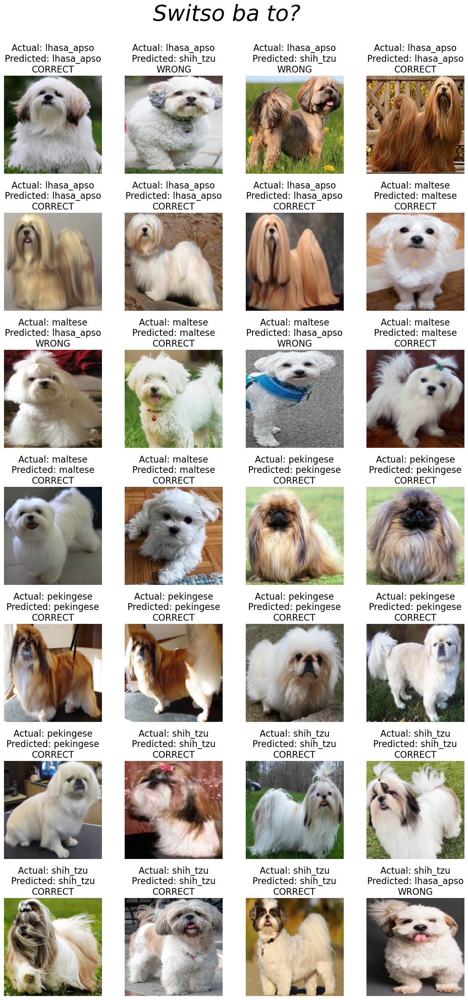

In [33]:
model.load_state_dict(torch.load('best_doggo_vgg19_model.pt'))
model.eval()

label_map = {k: v for k, v in enumerate(image_datasets['train'].classes)}

fig, ax = plt.subplots(7, 4, figsize=(15, 30))
ax = ax.flatten()
plt.suptitle("Switso ba to?", fontsize=40, fontstyle='oblique', fontweight=100, y=0.94)
plt.subplots_adjust(hspace=0.4)

inv_normalize = transforms.Normalize(
    mean=[-means[0] / stds[0], -means[1] / stds[1], -means[2] / stds[2]],
    std=[1 / stds[0], 1 / stds[1], 1 / stds[2]]
)

for idx, (images, labels) in enumerate(test_loader):
    images = images.to(device)
    labels = labels.to(device)
        
    outputs = model(images)
    _, predicted = torch.max(outputs.data, 1)

    # Map the predicted class index to the corresponding label
    predicted_labels = [label_map[p.item()] for p in predicted]

    # Convert the labels to a list of strings
    actual_labels = [label_map[l.item()] for l in labels]

    # Iterate over the images, actual labels, and predicted labels
    for image, actual_label, predicted_label in zip(images, actual_labels, predicted_labels):
        # Move the image to the CPU and convert it to a NumPy array
        image = image.cpu().numpy()
        image = np.transpose(image, (1, 2, 0))

        # Reverse the normalization
        image = inv_normalize(torch.from_numpy(image).permute(2, 0, 1).float()).numpy()
        
        # Clip the image data to the valid range [0, 1]
        image = np.clip(image, 0, 1)
        
        # Transpose the dimensions of the image array
        image = np.transpose(image, (1, 2, 0))
        
        # Display the image
        ax[idx].imshow(image)
        ax[idx].axis('off')

        # Add the actual and predicted labels as title
        if actual_label == predicted_label:
            ax[idx].set_title(f"Actual: {actual_label}\nPredicted: {predicted_label}\nCORRECT", fontsize=16)
        else:
            ax[idx].set_title(f"Actual: {actual_label}\nPredicted: {predicted_label}\nWRONG", fontsize=16)
        fig.show()

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Out of the 28 images, it got 23 correct and only 5 wrong. That's a test accuracy of <b>82%</b>!</p>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">I personally cannot even identify those with such accuracy. That's the <i>paw</i>-er of AI!</p>

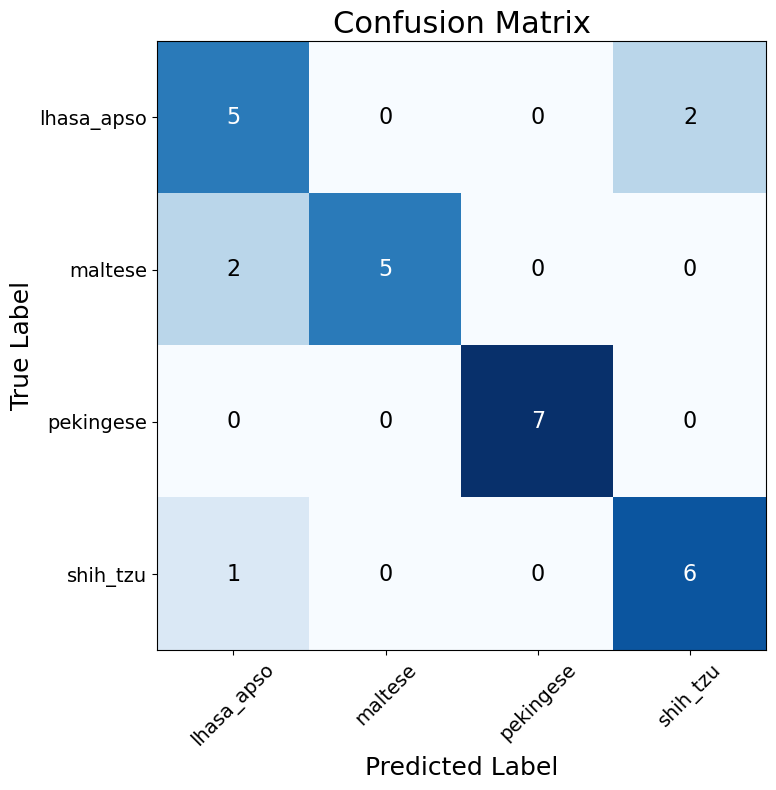

In [36]:
# Set the model to evaluation mode
model.eval()

# Initialize variables for predictions and ground truth labels
all_predictions = []
all_labels = []

# Get the predictions and labels for all test images
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Compute the confusion matrix
cm = confusion_matrix(all_labels, all_predictions)

# Display the confusion matrix
plt.figure(figsize=(8, 8))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix', fontsize=22)
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45, fontsize=14)
plt.yticks(tick_marks, class_names, fontsize=14)
plt.xlabel('Predicted Label', fontsize=18)
plt.ylabel('True Label', fontsize=18)

# Add labels to each cell in the matrix
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'), ha="center", va="center",
                 color="white" if cm[i, j] > thresh else "black", fontsize=16)

plt.tight_layout()
plt.show()

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Data scientists are always keen on checking which classes (breeds, in our case) get misclassified for each model. Good thing we have the <b>confusion matrix</b> to give us a quick visualization of which of the four switso-lookalike breeds get misclassified more often by our model.</p>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Pekingese seem to be the most distinct among them, considering none were misclassified. I guess we can fully agree that their droopy faces are visually distinct from their switso brethren. Lhasa Apsos and Shih Tzus can sometimes get confused with one another, which is pretty intuitive because with certain grooming patterns, they can look extremely alike. Last but not least, the Maltese can be misclassified as a Lhasa Apso. My intuition thinks this might be due to the grooming techniques.</p>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Overall, the model appears to be fairly reliable in distinguishing the household favorite doggo look— that cute, innocent yet cuddly switso look. There's no denying that this robust VGG-19 model of ours can definitely identify these four confusing breeds much better than your common folk in the street can (<i>and me!</i>).</p>

<h1 style="font-family:Verdana; color:#0D52BD; font-size:26px">Predict your Switsos!</h1>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">To facilitate an even smoother way of making quick predictions on our furry little frems, this is the same switso prediction code from earlier but condensed into an easy-to-use function. What an easier way to know if <code>switso_ba_to</code>!</p>

In [37]:
def switso_ba_to(image_path, model_name='best_doggo_vgg19_model.pt'):
    """
    Classify an image using a trained model and print a message based on the predicted label.
    
    Args:
        model_name (str): File path of the trained model to load.
        image_path (str): File path of the input image to classify.
    
    Returns:
        None
    """
    data_dir = Path('cropped_doggos')
    train_dir = data_dir / "train"
    
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    
    train_data = datasets.ImageFolder(root=train_dir, transform=transform)
    
    if os.path.exists('all_images.pkl'):
        all_images = joblib.load('all_images.pkl')
    else:
        all_images = torch.stack([img_t for img_t, _ in train_data], dim=3)
        joblib.dump(all_images, 'all_images.pkl')
    
    means = all_images.view(3, -1).mean(dim=1).numpy()
    stds = all_images.view(3, -1).std(dim=1).numpy()
    
    model = models.vgg19(pretrained=False)
    model.classifier[-1] = nn.Linear(in_features=4096, out_features=4, bias=True)
    model.load_state_dict(torch.load(model_name))
    model.eval()
    
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=means, std=stds),
    ])
    
    image = Image.open(image_path)
    
    plt.imshow(image)
    plt.axis('off')

    input_tensor = preprocess(image)
    input_tensor = input_tensor.unsqueeze(0)
    
    outputs = model(input_tensor)
    _, predicted = torch.max(outputs.data, 1)
    
    label_map = {0: 'lhasa_apso', 1: 'maltese', 2: 'pekingese', 3: 'shih_tzu'}
    predicted_label = label_map[predicted.item()]
    
    if predicted_label == 'lhasa_apso':
        print("This is actually a majestic Lhasa Apso!")
    elif predicted_label == 'maltese':
        print("Not a switso, but one cutiepie Maltese doggo!")
    elif predicted_label == 'pekingese':
        print("It is a pek switso (hehe get it? jk). This is a floofy Pekingese!")
    else:
        print("Yes, this is one cute adorbs Shih Tzu!")

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;"><i>Paw</i>-some! The model got it right.</p>

Yes, this is one cute adorbs Shih Tzu!


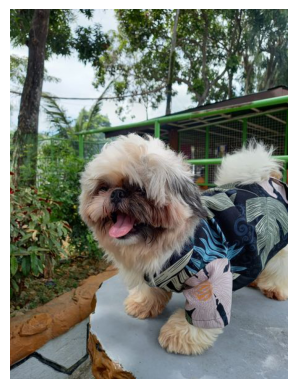

In [51]:
switso_ba_to('more_doggos/shih_tzu_1.jpeg')

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Oops, a tiny hiccup!</p>

This is actually a majestic Lhasa Apso!


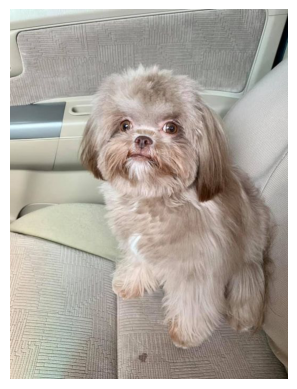

In [52]:
switso_ba_to('more_doggos/shih_tzu_3.jpeg')

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Got it right again!</p>

Not a switso, but one cutiepie Maltese doggo!


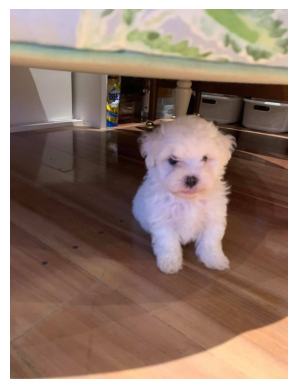

In [53]:
switso_ba_to('more_doggos/maltese_1.jpeg')

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;"><i>Fur</i>-nomenal performance so far!</p>

It is a pek switso (hehe get it? jk). This is a floofy Pekingese!


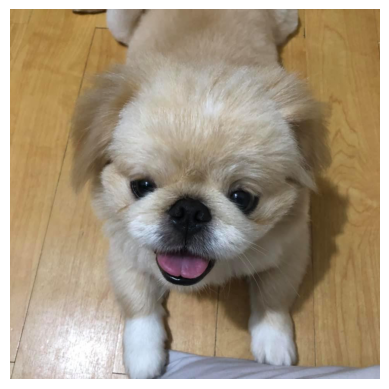

In [54]:
switso_ba_to('more_doggos/pekingese_3.jpeg')

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Hmmm, the model seemed a bit confused about this Lhasa Apso.</p>

Not a switso, but one cutiepie Maltese doggo!


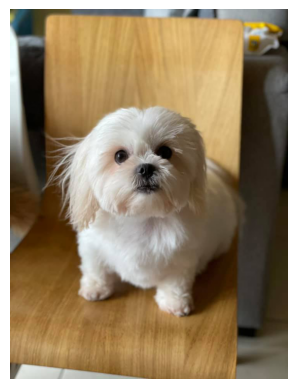

In [55]:
switso_ba_to('more_doggos/lhasa_apso_2.jpeg')

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Let's end this with a win. <i>Wag</i>-tastic!</p>

This is actually a majestic Lhasa Apso!


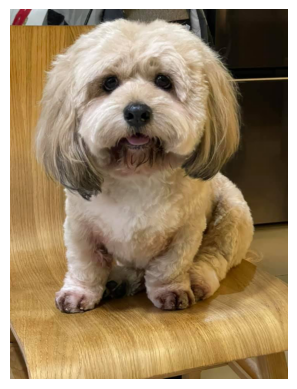

In [59]:
switso_ba_to('more_doggos/lhasa_apso_1.jpeg')

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">However, we should be aware of the obvious limitations of the model. It was only trained to identify four breeds: the Lhasa Apso, Maltese, Pekingese, and Shih Tzu. For example, it makes a very wild guess for breeds outside these four breeds it was trained on. Kwenk is a Chihuahua-Japanese Spitz mix and definitely not a Lhasa Apso!</p>

This is actually a majestic Lhasa Apso!


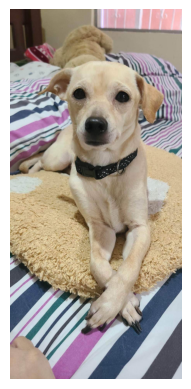

In [60]:
switso_ba_to('more_doggos/kwenk.jpg')

<h1 style="font-family:Verdana; color:#0D52BD; font-size:26px">Explainable AI</h1>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">But wait, there's more! If you are curious how the convolutional layers in our trained VGG-19 architecture evaluated the image, check out my <code>GradCAM</code> implementation below. I packaged it in a function called <code>show_gradcam</code> to make it easier for you to run.</p>

In [61]:
def show_gradcam(image_path, model_name='best_doggo_vgg19_model.pt'):
    """
    Display GradCAM visualizations for different layers of a VGG-19 model on the input image.
    
    Args:
        image_path (str): Path to the input image file.
    
    Returns:
        None
    """
    feat_conv = [0, 2, 5, 7, 10, 12, 14, 16, 19, 21, 23, 25, 28, 30, 32, 34]
    
    data_dir = Path('cropped_doggos')
    train_dir = data_dir / "train"
    
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    
    train_data = datasets.ImageFolder(root=train_dir, transform=transform)
    
    if os.path.exists('all_images.pkl'):
        all_images = joblib.load('all_images.pkl')
    else:
        all_images = torch.stack([img_t for img_t, _ in train_data], dim=3)
        joblib.dump(all_images, 'all_images.pkl')
    
    means = all_images.view(3, -1).mean(dim=1).numpy()
    stds = all_images.view(3, -1).std(dim=1).numpy()
    
    model = models.vgg19(pretrained=False)
    model.classifier[-1] = nn.Linear(in_features=4096, out_features=4, bias=True)
    model.load_state_dict(torch.load(model_name))
    model.eval()
    
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=means, std=stds),
    ])
    
    image = Image.open(image_path)
    input_tensor = preprocess(image)
    input_tensor = input_tensor.unsqueeze(0)

    fig, ax = plt.subplots(4, 4, figsize=(20, 20))
    ax = ax.flatten()

    for i, layer in tqdm(enumerate(feat_conv)):
        target_layers = [model.features[layer]]

        cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

        # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
        grayscale_cam = cam(input_tensor=input_tensor)

        # In this example grayscale_cam has only one image in the batch:
        grayscale_cam = grayscale_cam[0, :]

        # Now we load and resize the original image for display purposes
        original_image = np.array(Image.open(image_path).resize((224, 224)), dtype=np.float32) / 255

        # Use the utility function to overlay the CAM on the image
        overlay_cam = show_cam_on_image(original_image, grayscale_cam)

        ax[i].set_title(f'features[{layer}]')

        # Display the result
        ax[i].imshow(overlay_cam)
        ax[i].axis('off')
    
    plt.show()

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">During the first (shallow) convolutional layers of the VGG-19 model, the model learns the edges in the image. Once it has identified the edges, it begins to learn the textures, such as surfaces and doggo fur. As it progresses deeper into the layers, the filters in the convolutional layers start to learn shapes and different parts of the image. It learns to combine these higher-level features to form more abstract representations of the image.</p>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Ultimately, the dense layers at the tail end of the model are responsible for classifying the input based on all of these features extracted by the 16 convolutional layers in our VGG-19 model. It classifies which breed among the 4 breeds we specified (Lhasa Apso, Maltese, Pekingese, or Shih Tzu) the doggo in the image probably is.</p>

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;">Essentially, the VGG-19 model learns to progressively extract and represent features of increasing complexity and abstraction, starting with low-level features like edges and progressing to higher-level features that capture more intricate patterns and shapes.</p>

0it [00:00, ?it/s]

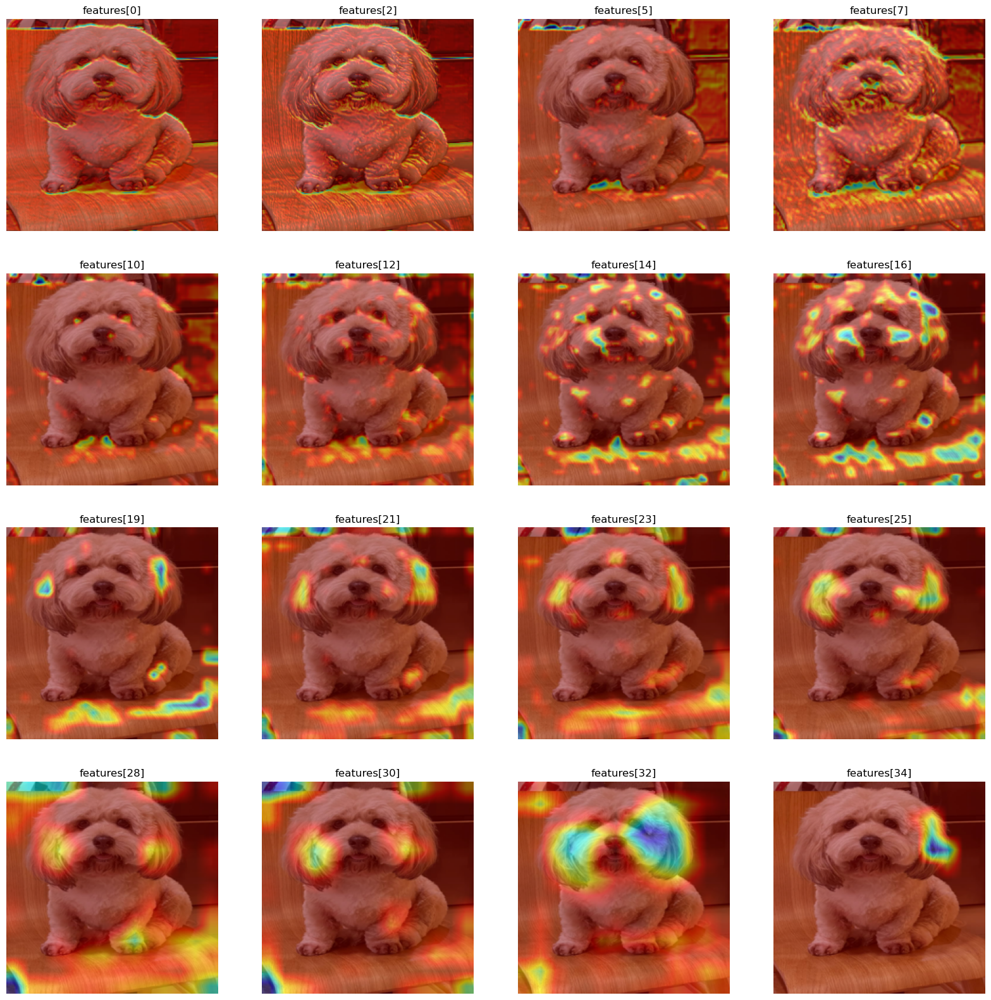

In [64]:
show_gradcam('more_doggos/lhasa_apso_1.jpeg')

0it [00:00, ?it/s]

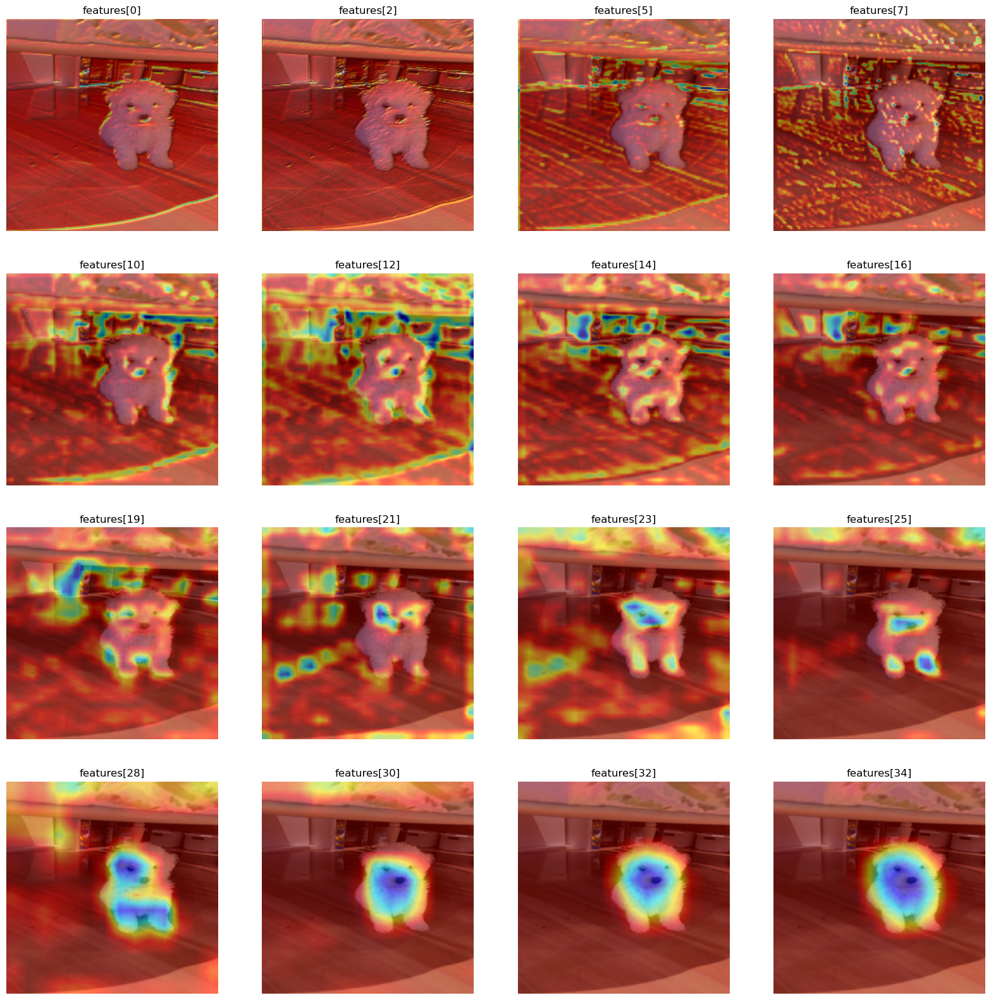

In [63]:
show_gradcam('more_doggos/maltese_1.jpeg')

0it [00:00, ?it/s]

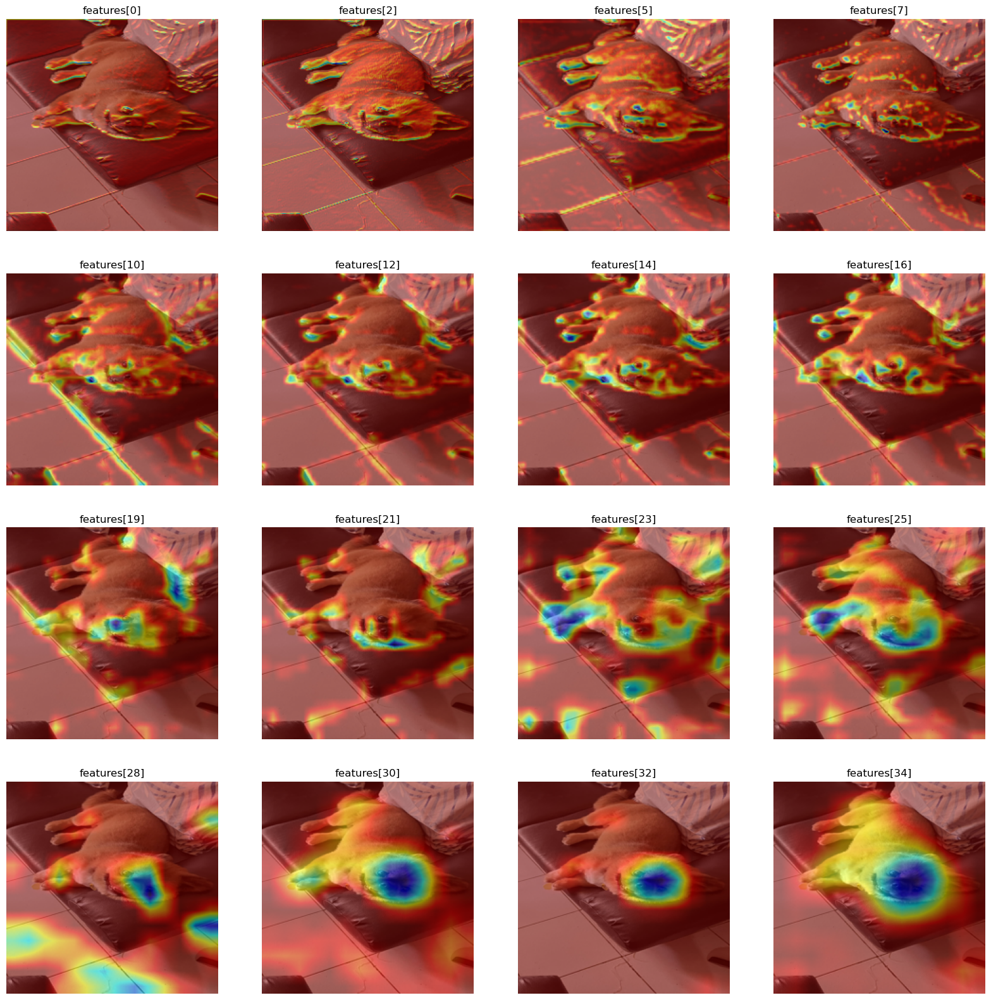

In [65]:
show_gradcam('more_doggos/pekingese_2.jpeg')

0it [00:00, ?it/s]

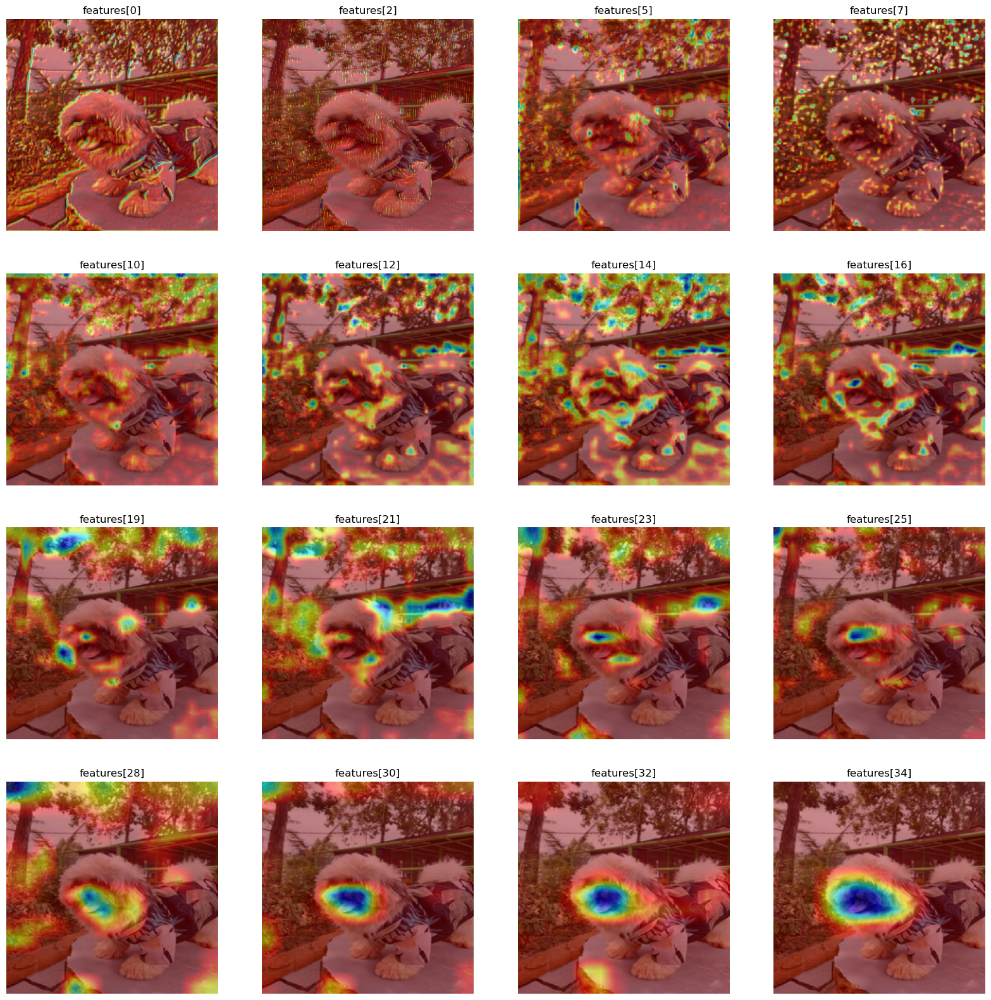

In [66]:
show_gradcam('more_doggos/shih_tzu_1.jpeg')

<p style="font-family: Verdana; font-size: 16px; text-align: justify; line-height: 1.8;"><b>Congratulations!</b> You have just successfully trained a deep learning model to address and answer one of the dilemmas a Filipino furparent faces when seeing a dog like these four cute little breeds. Even though you may still not be able to personally differentiate these four, your model surely can. <b>Don't go around calling them switsos anymore, okay?</b> Just whip this model out, and you can be fairly certain to hit the right name this time.</p>

<p style="font-family: Verdana; font-size: 18px; text-align: justify; line-height: 1.8;"><b>Now it's time to <i>paw</i>-ty!!!</b></p>